In [1]:
import scanpy as sc
import os,sys,glob
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams['pdf.fonttype'] = 42
sc.settings.n_jobs = 40
sc.set_figure_params(figsize=(6,4), vector_friendly = True)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'


In [2]:
adata = sc.read_h5ad("Data/Output_240308_adata_scvi_random_sampleID_AddModuleScore.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 393060 × 49133
    obs: 'batch', 'sampleID', 'Age', 'Assay', 'Stage', 'Race', 'PMI', 'Hemisphere', 'Library', 'Brain Region', 'Dataset', 'Sex', 'Diagnosis', 'cluster_original', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', 'leiden_0.6', 'cluster_annotated', 'Leiden', 'Cell Type', 'REACTOME_INTERLEUKIN_10_SIGNALING', 'REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_12_SIGNALING', 'REACTOME_INTERLEUKIN_15_SIGNALING', 'REACTOME_INTERLEUKIN_17_SIGNALING', 'REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_1_SIGNALING', 'REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_21_SIGNALING', 'REACTOME_INTERLEUKIN_27_SIGNALING', 'REACTOME_INTERLEUKIN_2_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_2_SIGNALING', 'REACTOME_INTERLEUKIN_35_SIGNALLING', 'REACTOME_INTERLEUKIN_37_SIGNALING', 'REACTOME_INTERLEUKIN_3_INTERL

In [4]:
from scipy.stats import ranksums

# Get unique cell types
cell_types = adata.obs["Cell Type"].unique()
cell_types

['RG', 'Neuroblast', 'Vascular', 'Micro', 'Others', 'OPC', 'Astro', 'Inh', 'Ext', 'Oligo']
Categories (10, object): ['Astro' < 'Ext' < 'Inh' < 'Micro' ... 'RG' < 'Neuroblast' < 'Vascular' < 'Others']

In [7]:
# Perform Wilcoxon rank-sum test for each cell type against all others
for cell_type in cell_types:
    group_A = adata.obs["REACTOME_INTERLEUKIN_17_SIGNALING"][adata.obs["Cell Type"] == cell_type]
    group_B = adata.obs["REACTOME_INTERLEUKIN_17_SIGNALING"][adata.obs["Cell Type"] != cell_type]
    
    statistic, p_value = ranksums(group_A, group_B)
    print("Comparison for", cell_type, "vs. all others:")
    print("Wilcoxon rank-sum test statistic:", statistic)
    print("p-value:", p_value)
    print()

Comparison for RG vs. all others:
Wilcoxon rank-sum test statistic: 165.72401398705242
p-value: 0.0

Comparison for Neuroblast vs. all others:
Wilcoxon rank-sum test statistic: 177.73874983715422
p-value: 0.0

Comparison for Vascular vs. all others:
Wilcoxon rank-sum test statistic: 12.823057499990835
p-value: 1.2180102264616106e-37

Comparison for Micro vs. all others:
Wilcoxon rank-sum test statistic: 108.78545910633456
p-value: 0.0

Comparison for Others vs. all others:
Wilcoxon rank-sum test statistic: -2.995659283979381
p-value: 0.002738522335220107

Comparison for OPC vs. all others:
Wilcoxon rank-sum test statistic: -80.81419119144667
p-value: 0.0

Comparison for Astro vs. all others:
Wilcoxon rank-sum test statistic: -44.9343735790435
p-value: 0.0

Comparison for Inh vs. all others:
Wilcoxon rank-sum test statistic: -31.049257725022354
p-value: 1.1674841353417448e-211

Comparison for Ext vs. all others:
Wilcoxon rank-sum test statistic: 20.954629604711016
p-value: 1.70248261297

In [12]:
adata.obs.columns

Index(['batch', 'sampleID', 'Age', 'Assay', 'Stage', 'Race', 'PMI',
       'Hemisphere', 'Library', 'Brain Region', 'Dataset', 'Sex', 'Diagnosis',
       'cluster_original', 'n_genes', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'doublet_scores',
       'predicted_doublets', '_scvi_batch', '_scvi_labels', 'leiden_0.6',
       'cluster_annotated', 'Leiden', 'Cell Type',
       'REACTOME_INTERLEUKIN_10_SIGNALING',
       'REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_12_SIGNALING',
       'REACTOME_INTERLEUKIN_15_SIGNALING',
       'REACTOME_INTERLEUKIN_17_SIGNALING',
       'REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_1_SIGNALING',
       'REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_21_SIGNALING',
       'REACTOME_INTERLEUKIN_27_SIGNALING',
       'REACTOME_INTERLEUKIN_2_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_2_SIGNALING',
       'REACTOME_INTERLEUKIN_35_SIGNALLI

In [13]:
import pandas as pd
from scipy.stats import ranksums

# Get unique cell types
cell_types = adata.obs["Cell Type"].unique()

# Create an empty dataframe to store results
results_df = pd.DataFrame(columns=['Cell Type', 'Feature', 'Wilcoxon rank-sum test statistic', 'p-value'])

# Iterate over each feature/column starting from index 25
for column in adata.obs.iloc[:, 27:]:
    feature_name = column
    
    # Perform Wilcoxon rank-sum test for each cell type against all others
    for cell_type in cell_types:
        group_A = adata.obs[feature_name][adata.obs["Cell Type"] == cell_type]
        group_B = adata.obs[feature_name][adata.obs["Cell Type"] != cell_type]

        statistic, p_value = ranksums(group_A, group_B)

        # Append results to the dataframe
        results_df = results_df.append({'Cell Type': cell_type,
                                        'Feature': feature_name,
                                        'Wilcoxon rank-sum test statistic': statistic,
                                        'p-value': p_value}, ignore_index=True)

# Display the results dataframe
print(results_df)


      Cell Type                                            Feature  \
0            RG                  REACTOME_INTERLEUKIN_10_SIGNALING   
1    Neuroblast                  REACTOME_INTERLEUKIN_10_SIGNALING   
2      Vascular                  REACTOME_INTERLEUKIN_10_SIGNALING   
3         Micro                  REACTOME_INTERLEUKIN_10_SIGNALING   
4        Others                  REACTOME_INTERLEUKIN_10_SIGNALING   
..          ...                                                ...   
725         OPC  REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS   
726       Astro  REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS   
727         Inh  REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS   
728         Ext  REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS   
729       Oligo  REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS   

     Wilcoxon rank-sum test statistic       p-value  
0                          -96.463860  0.000000e+00  
1                          -66.194222  0.000000e+00

In [14]:
results_df

,Cell Type,Feature,Wilcoxon rank-sum test statistic,p-value
0,RG,REACTOME_INTERLEUKIN_10_SIGNALING,-96.463860,0.000000e+00
1,Neuroblast,REACTOME_INTERLEUKIN_10_SIGNALING,-66.194222,0.000000e+00
2,Vascular,REACTOME_INTERLEUKIN_10_SIGNALING,39.405281,0.000000e+00
3,Micro,REACTOME_INTERLEUKIN_10_SIGNALING,153.024881,0.000000e+00
4,Others,REACTOME_INTERLEUKIN_10_SIGNALING,5.995383,2.030069e-09
...,...,...,...,...
725,OPC,REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS,-20.462609,4.638861e-93
726,Astro,REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS,118.271431,0.000000e+00
727,Inh,REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS,20.564237,5.739600e-94
728,Ext,REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS,-96.624871,0.000000e+00


In [15]:
results_df.to_csv("ranktest.csv")

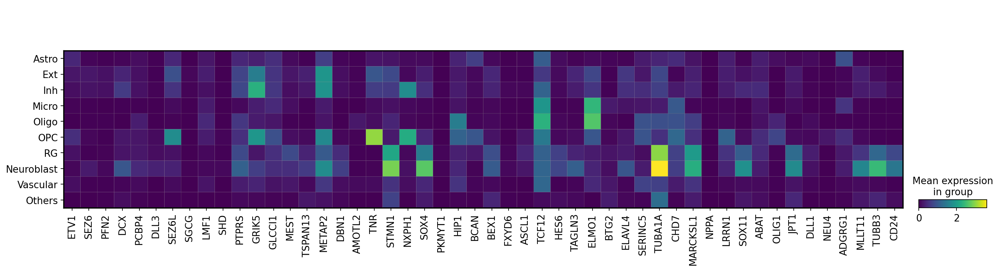

In [23]:
sc.set_figure_params(figsize=(4,4), vector_friendly = True)
# sc.pl.umap(adata, color = ["Cell Type", "DLL1"])

sc.pl.matrixplot(adata, ['ETV1', 'SEZ6', 'PFN2', 'DCX', 'PCBP4', 'DLL3', 'SEZ6L', 'SGCG', 'LMF1', 'SHD', 'PTPRS', 'GRIK5', 'GLCCI1', 'MEST', 'TSPAN13', 'METAP2', 'DBN1', 'AMOTL2', 'TNR', 'STMN1', 'NXPH1', 'SOX4', 'PKMYT1', 'HIP1', 'BCAN', 'BEX1', 'FXYD6', 'ASCL1', 'TCF12', 'HES6', 'TAGLN3', 'ELMO1', 'BTG2', 'ELAVL4', 'SERINC5', 'TUBA1A', 'CHD7', 'MARCKSL1', 'NPPA', 'LRRN1', 'SOX11', 'ABAT', 'OLIG1', 'JPT1', 'DLL1', 'NEU4', 'ADGRG1', 'MLLT11', 'TUBB3', 'CD24'], groupby = "Cell Type")


# Previous

In [3]:
adata.obs["Stage"].value_counts()

Adult (40-60Y)           74482
Fetal (1st trimester)    68108
Adult (60-80Y)           55500
Adult (20-40Y)           45656
Neonatal                 37254
Fetal (2nd trimester)    35183
Childhood (1-6Y)         30726
Adolescence (12-20Y)     14010
Childhood (6-12Y)        13739
Adult (>80Y)             11967
Fetal (3rd trimester)     6435
Name: Stage, dtype: int64

In [4]:
import rpy2.robjects as robjects

# Load the RDS file
r_data = robjects.r['readRDS']('LOEF_genes.RDS')
# python_dict1 = dict(zip(r_data.names, map(list, list(r_data))))

In [6]:
len(set(r_data) & set(adata.var_names))

3120

In [7]:
genes_not_included = set(r_data) - set(adata.var_names)

# Displaying the result
print("Genes not included in adata_var_names:")
print(genes_not_included)

Genes not included in adata_var_names:
{'CSNK2A1', 'EBP', 'MGA', 'RAF1', 'DLC1', 'HK1', 'GRIP1', 'USP10', 'SKP2', 'GJC1', 'RAI1', 'DLG3', 'PBX2', 'CAD', 'SPIN1', 'SRGAP2', 'ENSG00000241489', 'ENSG00000258465', 'MTF1', 'NTNG1', 'CCNL1', 'TUBB', 'AR', 'HTT', 'ADAM23', 'CHD5', 'DLG4', 'SAP130', 'RAE1', 'GDA', 'MAP2', 'ENSG00000273217', 'APC2', 'TCF4', 'ENSG00000257390', 'DLG2', 'PAN2', 'ERF', 'HGF', 'RP2', 'ATP2B2', 'RFC1', 'GLA', 'ENSG00000260836', 'BAP1', 'USP12', 'NAF1', 'ISY1', 'DLG1', 'CNP', 'ROR1', 'MAP1A', 'SCD', 'GLS', 'MGAT1', 'RNF165', 'RHEB', 'SLIT1', 'EIF3A', 'ATF2', 'CIC', 'DEF6', 'LDB1', 'GRIK2', 'ENSG00000268643', 'RS1'}


In [8]:
ncbi_genes = pd.read_csv('Homo_sapiens.gene_info.gz', sep='\t')
hgnc = pd.read_csv('non_alt_loci_set.230328.txt', sep='\t')

/home/ssun1116/anaconda3/envs/BrainAtlas/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3221: DtypeWarning: Columns (32,34,38,40,50) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [9]:
ncbi_genes

,#tax_id,GeneID,Symbol,LocusTag,Synonyms,dbXrefs,chromosome,map_location,description,type_of_gene,Symbol_from_nomenclature_authority,Full_name_from_nomenclature_authority,Nomenclature_status,Other_designations,Modification_date,Feature_type
0,9606,1,A1BG,-,A1B|ABG|GAB|HYST2477,MIM:138670|HGNC:HGNC:5|Ensembl:ENSG00000121410...,19,19q13.43,alpha-1-B glycoprotein,protein-coding,A1BG,alpha-1-B glycoprotein,O,alpha-1B-glycoprotein|HEL-S-163pA|epididymis s...,20230321,-
1,9606,2,A2M,-,A2MD|CPAMD5|FWP007|S863-7,MIM:103950|HGNC:HGNC:7|Ensembl:ENSG00000175899...,12,12p13.31,alpha-2-macroglobulin,protein-coding,A2M,alpha-2-macroglobulin,O,alpha-2-macroglobulin|C3 and PZP-like alpha-2-...,20230321,-
2,9606,3,A2MP1,-,A2MP,HGNC:HGNC:8|Ensembl:ENSG00000291190|AllianceGe...,12,12p13.31,alpha-2-macroglobulin pseudogene 1,pseudo,A2MP1,alpha-2-macroglobulin pseudogene 1,O,pregnancy-zone protein pseudogene,20230321,-
3,9606,9,NAT1,-,AAC1|MNAT|NAT-1|NATI,MIM:108345|HGNC:HGNC:7645|Ensembl:ENSG00000171...,8,8p22,N-acetyltransferase 1,protein-coding,NAT1,N-acetyltransferase 1,O,arylamine N-acetyltransferase 1|N-acetyltransf...,20230321,-
4,9606,10,NAT2,-,AAC2|NAT-2|PNAT,MIM:612182|HGNC:HGNC:7646|Ensembl:ENSG00000156...,8,8p22,N-acetyltransferase 2,protein-coding,NAT2,N-acetyltransferase 2,O,arylamine N-acetyltransferase 2|N-acetyltransf...,20230321,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142336,741158,8923215,trnD,-,-,-,MT,-,tRNA-Asp,tRNA,-,-,-,-,20200909,-
142337,741158,8923216,trnP,-,-,-,MT,-,tRNA-Pro,tRNA,-,-,-,-,20200909,-
142338,741158,8923217,trnA,-,-,-,MT,-,tRNA-Ala,tRNA,-,-,-,-,20200909,-
142339,741158,8923218,COX1,-,-,-,MT,-,cytochrome c oxidase subunit I,protein-coding,-,-,-,cytochrome c oxidase subunit I,20200909,-


In [10]:
# wget https://ftp.ncbi.nih.gov/gene/DATA/GENE_INFO/Mammalia/Homo_sapiens.gene_info.gz
# https://ftp.ebi.ac.uk/pub/databases/genenames/hgnc/tsv/non_alt_loci_set.txt 
ncbi_genes = pd.read_csv('Homo_sapiens.gene_info.gz', sep='\t')
hgnc = pd.read_csv('non_alt_loci_set.230328.txt', sep='\t')

# Create a dictionary to contain symbol:symbol and alias_symbol:symbol
# NCBI
gene_dict = {}
for index, row in ncbi_genes.iterrows():
    gene_dict[row['Symbol']] = row['Symbol']
    if pd.notna(row['Synonyms']):
        aliases = row['Synonyms'].split('|')
        for alias in aliases:
            gene_dict[alias] = row['Symbol']    

# HGNC
for index, row in hgnc.iterrows():
    gene_dict[row['symbol']] = row['symbol']
    if pd.notna(row['alias_symbol']):
        aliases = row['alias_symbol'].split('|')
        for alias in aliases:
            gene_dict[alias] = row['symbol']    
            
    if pd.notna(row['prev_symbol']):
        aliases = row['prev_symbol'].split('|')
        for alias in aliases:
            gene_dict[alias] = row['symbol']
            
    if pd.notna(row['lncipedia']):
        aliases = row['lncipedia'].split('|')
        for alias in aliases:
            gene_dict[alias] = row['symbol']

# Function to update gene name
def replace_gene_name(gene, gene_dict):
    if gene in gene_dict.keys():
        new_gene = gene_dict[gene]
    else:
        new_gene = 'None'
    return new_gene

len(gene_dict.keys())

/home/ssun1116/anaconda3/envs/BrainAtlas/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3221: DtypeWarning: Columns (32,34,38,40,50) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


222023

In [ ]:
new_list_data = []
for a in list_data:
    data_name = a.obs.Dataset.unique()[0]
    a.var['new_gene'] = a.var.index.to_series().apply(lambda x: replace_gene_name(x, gene_dict)) 
    
    number_genes = sum(a.var['new_gene']!='None')
    number_nogenes = sum(a.var['new_gene']=='None')
    
    print("{}:{} genes present.".format(data_name, number_genes))
    print("{}: {} genes missing.".format(data_name, number_nogenes))
    print ("")
    
    # Remove genes without gene information
    a = a[:, a.var['new_gene']!='None']
    
    # Set up index using updated genes
    a.var = a.var.set_index('new_gene')
    a.var_names_make_unique()
    
    # Append a new dataset
    new_list_data.append(a)

In [12]:
def replace_gene_name(gene):
    # Example logic: replace 'OldGeneName' with 'NewGeneName', otherwise leave unchanged
    if gene == 'OldGeneName':
        return 'NewGeneName'
    else:
        return gene


In [13]:
new_genes = [replace_gene_name(gene) for gene in r_data]

In [28]:
gene_dict

{'A1BG': 'A1BG',
 'A1B': 'SNTB1',
 'ABG': 'A1BG',
 'GAB': 'A1BG',
 'HYST2477': 'A1BG',
 'A2M': 'A2M',
 'A2MD': 'A2M',
 'CPAMD5': 'A2M',
 'FWP007': 'A2M',
 'S863-7': 'A2M',
 'A2MP1': 'A2MP1',
 'A2MP': 'A2MP1',
 'NAT1': 'SLC6A2',
 'AAC1': 'SLC25A4',
 'MNAT': 'NAT1',
 'NAT-1': 'SLC38A6',
 'NATI': 'NAT1',
 'NAT2': 'SLC38A1',
 'AAC2': 'NAT2',
 'NAT-2': 'NAT2',
 'PNAT': 'NAT2',
 'NATP': 'NATP',
 'AACP': 'NATP',
 'NATP1': 'NATP',
 'SERPINA3': 'SERPINA3',
 'AACT': 'SERPINA3',
 'ACT': 'SERPINA3',
 'GIG24': 'SERPINA3',
 'GIG25': 'SERPINA3',
 'AADAC': 'AADAC',
 'CES5A1': 'AADAC',
 'DAC': 'AADAC',
 'AAMP': 'AAMP',
 '-': '16S rRNA',
 'AANAT': 'AANAT',
 'DSPS': 'DSPS',
 'SNAT': 'AANAT',
 'AARS1': 'AARS1',
 'AARS': 'AARS1',
 'CMT2N': 'AARS1',
 'DEE29': 'AARS1',
 'EIEE29': 'AARS1',
 'HDLS2': 'AARS1',
 'TTD8': 'AARS1',
 'AAVS1': 'PPP1R12C',
 'AAV': 'AAVS1',
 'ABAT': 'ABAT',
 'GABA-AT': 'ABAT',
 'GABAT': 'ABAT',
 'NPD009': 'ABAT',
 'ABCA1': 'ABCA1',
 'ABC-1': 'ABCA1',
 'ABC1': 'HEATR6',
 'CERP': 'ABCA1'

In [30]:
import csv

# Path to the CSV file
csv_file = "gene_dict.csv"

with open(csv_file, "w", newline="") as f:
    writer = csv.writer(f)
    # Write header
    writer.writerow(["OldGene", "NewGene"])
    # Write data
    for old_gene, new_gene in gene_dict.items():
        writer.writerow([old_gene, new_gene])

In [14]:
new_genes

['GNB1',
 'GABRD',
 'SKI',
 'PANK4',
 'PRDM16',
 'TP73',
 'AJAP1',
 'CHD5',
 'PHF13',
 'DNAJC11',
 'CAMTA1',
 'RERE',
 'TMEM201',
 'PIK3CD',
 'CLSTN1',
 'UBE4B',
 'KIF1B',
 'PGD',
 'CASZ1',
 'TARDBP',
 'MTOR',
 'MFN2',
 'TNFRSF8',
 'VPS13D',
 'PRDM2',
 'DDI2',
 'SPEN',
 'ZBTB17',
 'FBXO42',
 'RCC2',
 'UBR4',
 'MRTO4',
 'HP1BP3',
 'EIF4G3',
 'ECE1',
 'RAP1GAP',
 'USP48',
 'EPHB2',
 'KDM1A',
 'HNRNPR',
 'RPL11',
 'ELOA',
 'LYPLA2',
 'GRHL3',
 'SRRM1',
 'MACO1',
 'ARID1A',
 'WDTC1',
 'WASF2',
 'AHDC1',
 'STX12',
 'PPP1R8',
 'EYA3',
 'RCC1',
 'TAF12',
 'GMEB1',
 'YTHDF2',
 'PTPRU',
 'PUM1',
 'ADGRB2',
 'PTP4A2',
 'KHDRBS1',
 'KPNA6',
 'TXLNA',
 'EIF3I',
 'LCK',
 'RBBP4',
 'S100PBP',
 'RNF19B',
 'ZNF362',
 'DLGAP3',
 'SFPQ',
 'ZMYM4',
 'NCDN',
 'AGO4',
 'AGO1',
 'AGO3',
 'MAP7D1',
 'THRAP3',
 'STK40',
 'GRIK3',
 'MTF1',
 'SF3A3',
 'RRAGC',
 'MACF1',
 'PABPC4',
 'RLF',
 'CTPS1',
 'HIVEP3',
 'FOXJ3',
 'YBX1',
 'SLC2A1',
 'PTPRF',
 'KDM4A',
 'IPO13',
 'ATP6V0B',
 'RNF220',
 'RPS8',
 'NASP',
 '

In [15]:
len(set(new_genes) & set(adata.var_names))

3120

In [21]:
def replace_gene_name(gene, gene_dict):
    if gene in gene_dict.keys():
        new_gene = gene_dict[gene]
    else:
        new_gene = 'None'
    return new_gene

In [22]:
new_genes = [replace_gene_name(gene, gene_dict) for gene in r_data]

In [26]:
new_genes

['GNB1',
 'GABRD',
 'SKI',
 'PANK4',
 'PRDM16',
 'TP73',
 'AJAP1',
 'GET1',
 'PHF13',
 'DNAJC11',
 'CAMTA1',
 'RERE',
 'TMEM201',
 'PIK3CD',
 'CLSTN1',
 'UBE4B',
 'KIF1B',
 'PGD',
 'CASZ1',
 'TARDBP',
 'MTOR',
 'MFN2',
 'TNFRSF8',
 'VPS13D',
 'PRDM2',
 'DDI2',
 'SPEN',
 'ZBTB17',
 'FBXO42',
 'RCC2',
 'UBR4',
 'MRTO4',
 'HP1BP3',
 'EIF4G3',
 'ECE1',
 'RAP1GAP',
 'USP48',
 'EPHB2',
 'KDM1A',
 'HNRNPR',
 'RPL11',
 'ELOA',
 'LYPLA2',
 'GRHL3',
 'SRRM1',
 'MACO1',
 'ARID1A',
 'WDTC1',
 'WASF2',
 'AHDC1',
 'STX12',
 'PPP1R8',
 'EYA3',
 'RCC1',
 'TAF12',
 'GMEB1',
 'YTHDF2',
 'PTPRU',
 'PUM1',
 'ADGRB2',
 'PTP4A2',
 'KHDRBS1',
 'KPNA6',
 'TXLNA',
 'EIF3I',
 'LCK',
 'RBBP4',
 'S100PBP',
 'RNF19B',
 'ZNF362',
 'DLGAP3',
 'SFPQ',
 'ZMYM4',
 'NCDN',
 'AGO4',
 'AGO1',
 'AGO3',
 'MAP7D1',
 'THRAP3',
 'STK40',
 'GRIK3',
 'MYT1',
 'SF3A3',
 'RRAGC',
 'MACF1',
 'PABPC4',
 'RLF',
 'CTPS1',
 'HIVEP3',
 'FOXJ3',
 'YBX1',
 'SLC2A1',
 'PTPRF',
 'KDM4A',
 'IPO13',
 'ATP6V0B',
 'RNF220',
 'RPS8',
 'NASP',
 '

In [24]:
len(set(new_genes) & set(adata.var_names))

3164

In [ ]:
new_genes

In [27]:
set(new_genes) - set(adata.var_names)

{'None'}

In [ ]:
def replace_gene_name(gene, gene_dict):
    if gene in gene_dict.keys():
        new_gene = gene_dict[gene]
    else:
        new_gene = 'None'
    return new_gene

In [5]:
adata_C12 = adata[adata.obs["Leiden"] == "C12"].copy()
adata_C12.obs[["Age", "Dataset"]].value_counts()

Age      Dataset 
154.0    Herring     4577
168.0    Herring     4359
451.0    Herring      453
238.0    Herring      358
367.0    Herring      263
483.0    Herring      218
399.0    Herring       96
115.5    Cameron       58
787.0    Herring       55
544.0    Herring       48
992.0    Herring       15
12775.0  Turecki        7
29930.0  ZhangPD        4
1095.0   Herring        4
25550.0  ZhangPD        2
29200.0  Morabito       1
1460.0   Herring        1
2555.0   Herring        1
22265.0  AllenM1        1
23360.0  ZhangPD        1
26645.0  ZhangPD        1
105.0    Braun          1
98.0     Braun          1
dtype: int64

In [4]:
adata_C12.obs["Stage"].value_counts()

Fetal (2nd trimester)    8994
Neonatal                 1078
Fetal (3rd trimester)     358
Childhood (1-6Y)           76
Adult (20-40Y)              7
Adult (60-80Y)              5
Adult (>80Y)                4
Fetal (1st trimester)       2
Adult (40-60Y)              1
Name: Stage, dtype: int64

In [5]:
import rpy2.robjects as robjects

# Load the RDS file
r_data = robjects.r['readRDS']('Resources/d1_list.RDS')
python_dict1 = dict(zip(r_data.names, map(list, list(r_data))))

r_data = robjects.r['readRDS']('Resources/d2_list.RDS')
python_dict2 = dict(zip(r_data.names, map(list, list(r_data))))

r_data = robjects.r['readRDS']('Resources/d3_list.RDS')
python_dict3 = dict(zip(r_data.names, map(list, list(r_data))))

In [ ]:
# Loop over each item in python_dict
for key, gene_list in python_dict1.items():
    print(key)
    # Run sc.tl.score_genes() for the current gene list
    sc.tl.score_genes(adata, gene_list, score_name = key)

# Loop over each item in python_dict
for key, gene_list in python_dict2.items():
    print(key)
    # Run sc.tl.score_genes() for the current gene list
    sc.tl.score_genes(adata, gene_list, score_name = key)

# Loop over each item in python_dict
for key, gene_list in python_dict3.items():
    print(key)
    # Run sc.tl.score_genes() for the current gene list
    sc.tl.score_genes(adata, gene_list, score_name = key)

In [5]:
adata.obs.columns

Index(['batch', 'sampleID', 'Age', 'Assay', 'Stage', 'Race', 'PMI',
       'Hemisphere', 'Library', 'Brain Region', 'Dataset', 'Sex', 'Diagnosis',
       'cluster_original', 'n_genes', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'doublet_scores',
       'predicted_doublets', '_scvi_batch', '_scvi_labels', 'leiden_0.6',
       'cluster_annotated', 'Leiden', 'Cell Type',
       'REACTOME_INTERLEUKIN_10_SIGNALING',
       'REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_12_SIGNALING',
       'REACTOME_INTERLEUKIN_15_SIGNALING',
       'REACTOME_INTERLEUKIN_17_SIGNALING',
       'REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_1_SIGNALING',
       'REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_21_SIGNALING',
       'REACTOME_INTERLEUKIN_27_SIGNALING',
       'REACTOME_INTERLEUKIN_2_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_2_SIGNALING',
       'REACTOME_INTERLEUKIN_35_SIGNALLI

In [11]:
for key, gene_list in python_dict1.items():
    # print(key)
    # Run sc.tl.score_genes() for the current gene list
    sc.pl.violin(adata, keys = key, groupby = "Cell Type", size = 0, rotation = 90,
                 save = "_Immune_" + key + ".png" , show = False)

for key, gene_list in python_dict2.items():
    # print(key)
    # Run sc.tl.score_genes() for the current gene list
    sc.pl.violin(adata, keys = key, groupby = "Cell Type", size = 0, rotation = 90,
                 save = "_Sex_" + key + ".png" , show = False)
    
for key, gene_list in python_dict3.items():
    # print(key)
    # Run sc.tl.score_genes() for the current gene list
    sc.pl.violin(adata, keys = key, groupby = "Cell Type", size = 0, rotation = 90,
                 save = "_Kinase_" + key + ".png" , show = False)

In [ ]:
for key, gene_list in python_dict1.items():
    # print(key)
    # Run sc.tl.score_genes() for the current gene list
    sc.pl.violin(adata, keys = key, groupby = "Cell Type", size = 0, rotation = 90,
                 save = "_Immune_" + key + ".png" , show = False)

In [4]:
desired_order = [
        # Excitatory
        'C12', 'C29', 'C25', 'C16', 'C17', 'C14', 'C36', 'C22', 'C5', 'C10', 'C1', 'C15', 'C34', 'C35',
        # Inhibitory
        'C20', 'C23', 'C21', 'C28', 'C8', 'C31', 'C6', 'C7', 'C19', 
        # Astro
        'C2', 'C27',
        # Micro
        'C39', 'C13',
        # Oligo
        'C0', 'C38',
        # OPC
        'C9', 'C32' ,
        # Vascular
        'C30', 
        # Others
        'C40',
        # RG
        'C4', 'C18', 'C37',
        # Neuroblast
        'C11','C33','C3','C24','C26',
 
    ]

In [19]:
# # Retrieve the keys (names) of the dictionaries stored in python_dict
# dictionary_names = python_dict1.keys()

# # Convert the keys to a list if you need it as a list
# dictionary_names_list = list(dictionary_names)

# print(dictionary_names_list)

['REACTOME_INTERLEUKIN_10_SIGNALING', 'REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_12_SIGNALING', 'REACTOME_INTERLEUKIN_15_SIGNALING', 'REACTOME_INTERLEUKIN_17_SIGNALING', 'REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_1_SIGNALING', 'REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_21_SIGNALING', 'REACTOME_INTERLEUKIN_27_SIGNALING', 'REACTOME_INTERLEUKIN_2_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_2_SIGNALING', 'REACTOME_INTERLEUKIN_35_SIGNALLING', 'REACTOME_INTERLEUKIN_37_SIGNALING', 'REACTOME_INTERLEUKIN_3_INTERLEUKIN_5_AND_GM_CSF_SIGNALING', 'REACTOME_INTERLEUKIN_4_AND_INTERLEUKIN_13_SIGNALING', 'REACTOME_INTERLEUKIN_6_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_6_SIGNALING', 'REACTOME_INTERLEUKIN_7_SIGNALING', 'REACTOME_INTERLEUKIN_RECEPTOR_SHC_SIGNALING', 'REACTOME_GROWTH_HORMONE_RECEPTOR_SIGNALING', 'REACTOME_INACTIVATION_OF_CSF3_G_CSF_SIGNALING', 'REACTOME_SIGNALING_BY_CSF3_G_CSF', 'REACTOME_FCGR3A_MEDIATED_IL10_SYNTHESIS', 'REA

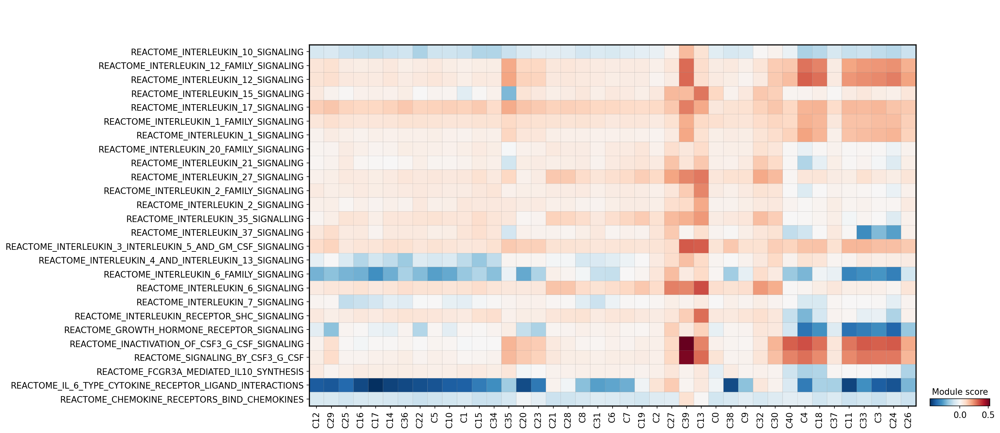

In [29]:
sc.pl.matrixplot(adata, list(python_dict1.keys()), swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "Matrixplot_Immune_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

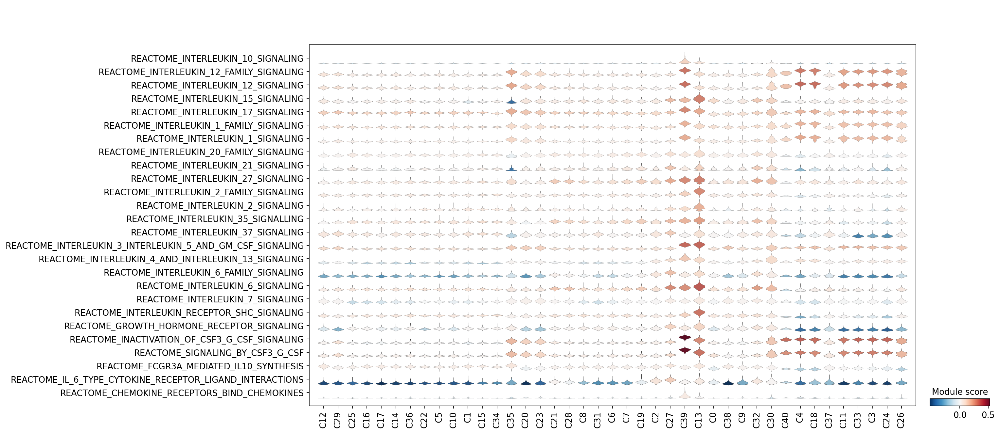

In [9]:
sc.pl.stacked_violin(adata, list(python_dict1.keys()), swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                  save = "Stackedplot_Immune_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

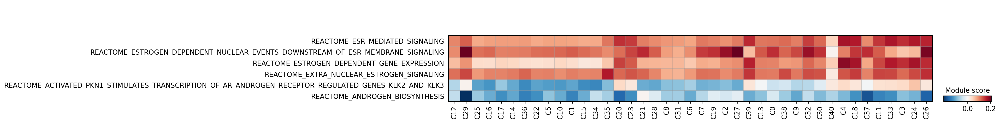

In [31]:
sc.pl.matrixplot(adata, list(python_dict2.keys()), swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "Matrixplot_SexHormone_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

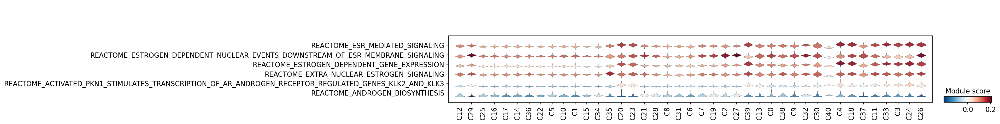

In [10]:
sc.pl.stacked_violin(adata, list(python_dict2.keys()), swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "Stackedplot_SexHormone_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

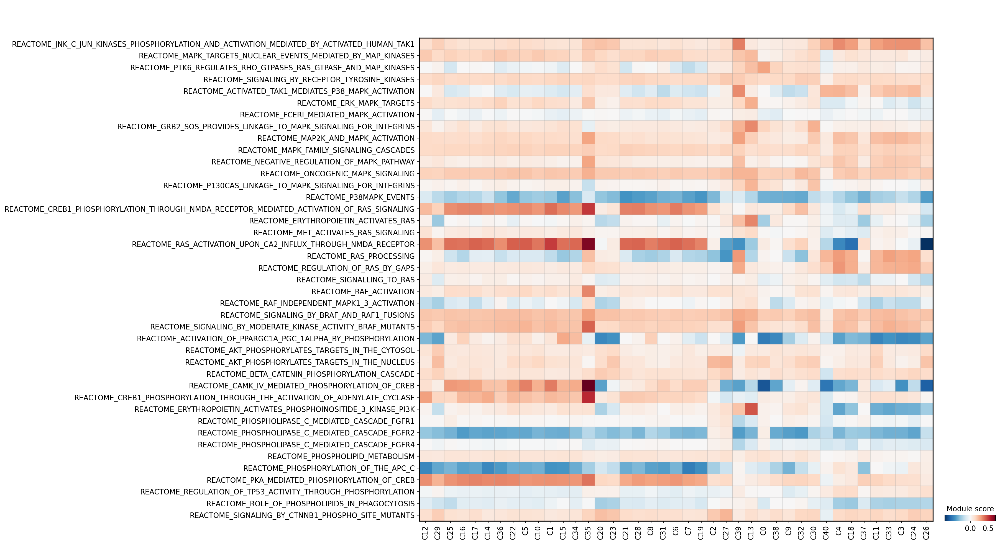

In [32]:
sc.pl.matrixplot(adata, list(python_dict3.keys()), swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "Matrixplot_Kinase_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

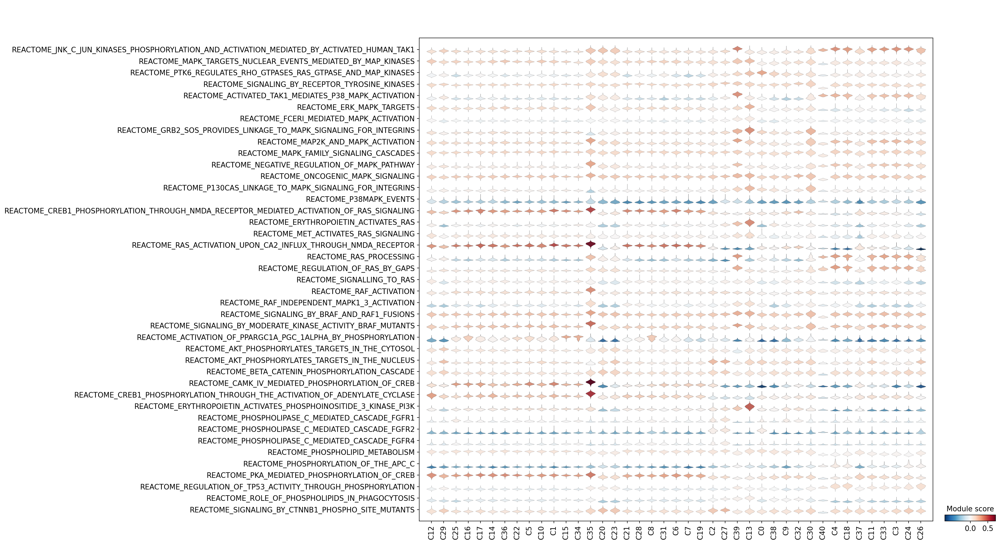

In [11]:
sc.pl.stacked_violin(adata, list(python_dict3.keys()), swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "Stackedplot_Kinase_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

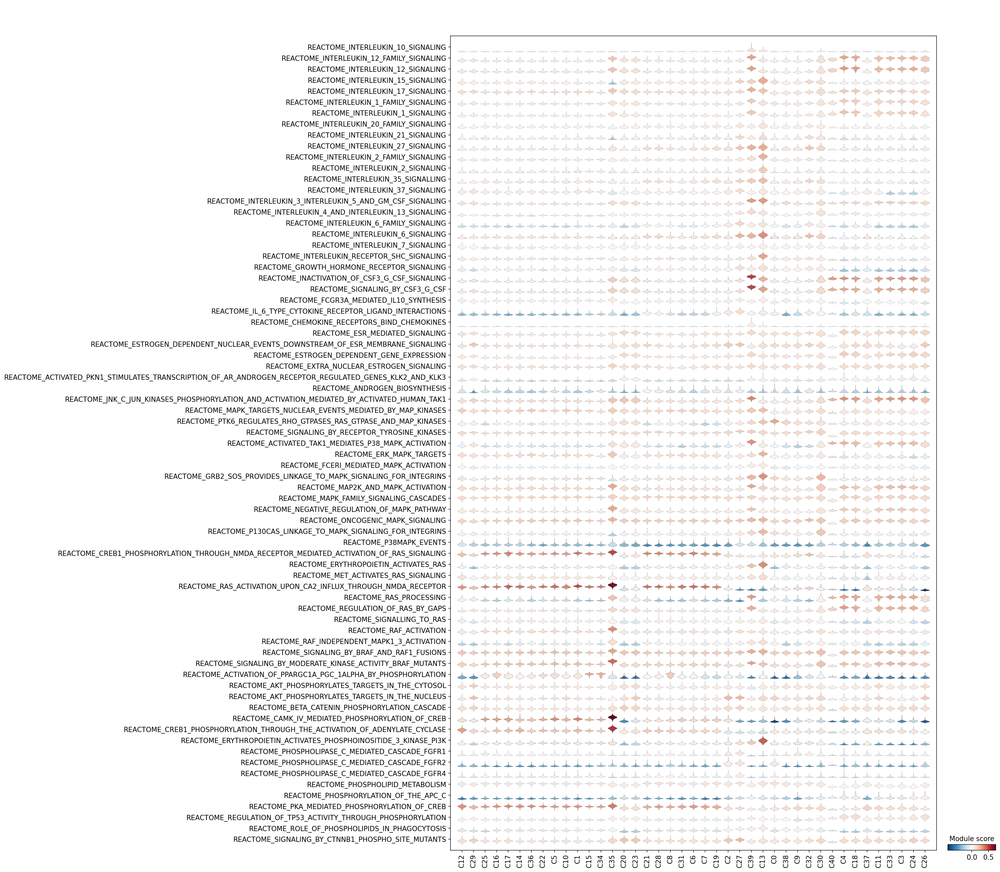

In [13]:
sc.pl.stacked_violin(adata, list(python_dict1.keys()) + list(python_dict2.keys()) + list(python_dict3.keys()), swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "Stackedplot_All_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

In [12]:
pathways = [
    "REACTOME_INTERLEUKIN_1_SIGNALING",
    "REACTOME_INTERLEUKIN_3_INTERLEUKIN_5_AND_GM_CSF_SIGNALING",
    "REACTOME_INTERLEUKIN_6_SIGNALING",
    "REACTOME_INTERLEUKIN_12_SIGNALING",
    "REACTOME_INTERLEUKIN_17_SIGNALING",
    "REACTOME_INTERLEUKIN_27_SIGNALING",
    "REACTOME_INTERLEUKIN_35_SIGNALLING",
    "REACTOME_INACTIVATION_OF_CSF3_G_CSF_SIGNALING",
    "REACTOME_SIGNALING_BY_CSF3_G_CSF",
    "REACTOME_ESR_MEDIATED_SIGNALING",
    # "REACTOME_ESTROGEN_DEPENDENT_NUCLEAR_EVENTS_DOWNSTREAM_OF_ESR_MEMBRANE_SIGNALING",
    "REACTOME_ESTROGEN_DEPENDENT_GENE_EXPRESSION",
    "REACTOME_EXTRA_NUCLEAR_ESTROGEN_SIGNALING",
    # "REACTOME_JNK_C_JUN_KINASES_PHOSPHORYLATION_AND_ACTIVATION_MEDIATED_BY_ACTIVATED_HUMAN_TAK1",
    "REACTOME_ACTIVATED_TAK1_MEDIATES_P38_MAPK_ACTIVATION",
    "REACTOME_MAP2K_AND_MAPK_ACTIVATION",
    "REACTOME_NEGATIVE_REGULATION_OF_MAPK_PATHWAY",
    # "REACTOME_CREB1_PHOSPHORYLATION_THROUGH_NMDA_RECEPTOR_MEDIATED_ACTIVATION_OF_RAS_SIGNALING",
    "REACTOME_RAS_ACTIVATION_UPON_CA2_INFLUX_THROUGH_NMDA_RECEPTOR",
    "REACTOME_RAS_PROCESSING",
    "REACTOME_REGULATION_OF_RAS_BY_GAPS",
    "REACTOME_PKA_MEDIATED_PHOSPHORYLATION_OF_CREB"
]

In [6]:
desired_order = [
        # Excitatory
        'C12', 'C29', 'C25', 'C16', 'C17', 'C14', 'C36', 'C22', 'C5', 'C10', 'C1', 'C15', 'C34', 'C35',
        # Inhibitory
        'C20', 'C23', 'C21', 'C28', 'C8', 'C31', 'C6', 'C7', 'C19', 
        # Astro
        'C2', 'C27',
        # Micro
        'C39', 'C13',
        # Oligo
        'C0', 'C38',
        # OPC
        'C9', 'C32' ,
        # Vascular
        'C30', 
        # Others
        'C40',
        # RG
        'C4', 'C18', 'C37',
        # Neuroblast
        'C11','C33','C3','C24','C26',
    ]

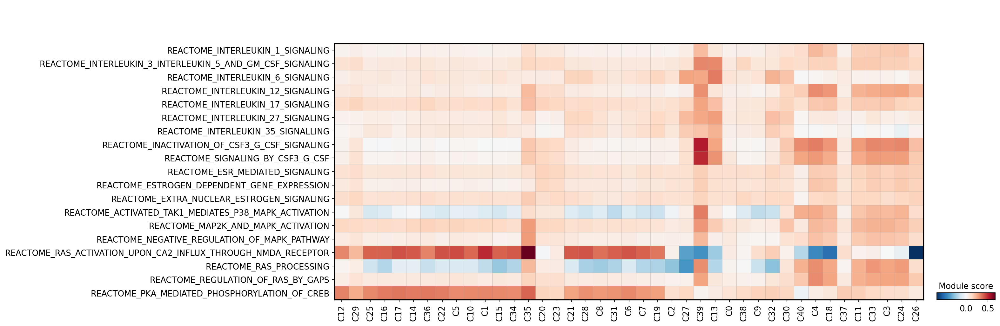

In [13]:
sc.pl.matrixplot(adata, pathways, swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "MatrixPlot_Selected_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

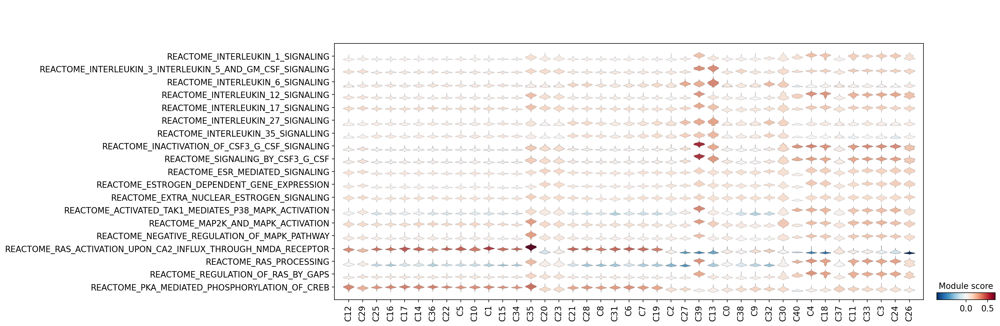

In [14]:
sc.pl.stacked_violin(adata, pathways, swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "Stackedplot_Selected_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

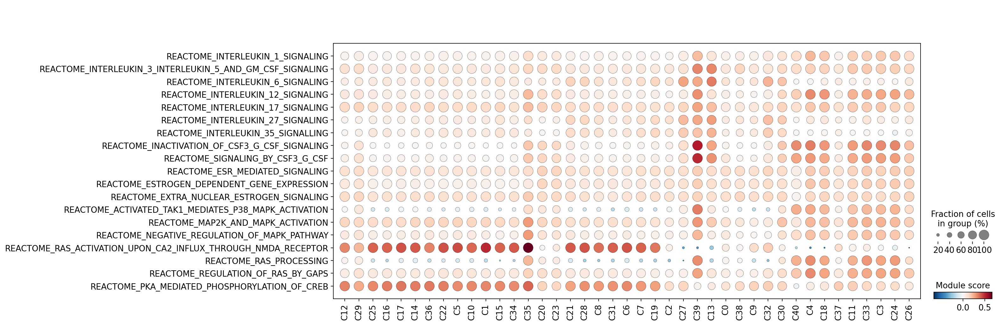

In [15]:
sc.pl.dotplot(adata, pathways, swap_axes=True,
                 categories_order = desired_order, groupby='Leiden',
                 save = "Dotplot_Selected_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

In [4]:
adata

AnnData object with n_obs × n_vars = 393060 × 49133
    obs: 'batch', 'sampleID', 'Age', 'Assay', 'Stage', 'Race', 'PMI', 'Hemisphere', 'Library', 'Brain Region', 'Dataset', 'Sex', 'Diagnosis', 'cluster_original', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_scores', 'predicted_doublets', '_scvi_batch', '_scvi_labels', 'leiden_0.6', 'cluster_annotated', 'Leiden', 'Cell Type', 'REACTOME_INTERLEUKIN_10_SIGNALING', 'REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_12_SIGNALING', 'REACTOME_INTERLEUKIN_15_SIGNALING', 'REACTOME_INTERLEUKIN_17_SIGNALING', 'REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_1_SIGNALING', 'REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_21_SIGNALING', 'REACTOME_INTERLEUKIN_27_SIGNALING', 'REACTOME_INTERLEUKIN_2_FAMILY_SIGNALING', 'REACTOME_INTERLEUKIN_2_SIGNALING', 'REACTOME_INTERLEUKIN_35_SIGNALLING', 'REACTOME_INTERLEUKIN_37_SIGNALING', 'REACTOME_INTERLEUKIN_3_INTERL

In [3]:
df = adata.obs

In [4]:
df2 = df.iloc[:,25:]

In [5]:
df2.columns

Index(['Leiden', 'Cell Type', 'REACTOME_INTERLEUKIN_10_SIGNALING',
       'REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_12_SIGNALING',
       'REACTOME_INTERLEUKIN_15_SIGNALING',
       'REACTOME_INTERLEUKIN_17_SIGNALING',
       'REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_1_SIGNALING',
       'REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_21_SIGNALING',
       'REACTOME_INTERLEUKIN_27_SIGNALING',
       'REACTOME_INTERLEUKIN_2_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_2_SIGNALING',
       'REACTOME_INTERLEUKIN_35_SIGNALLING',
       'REACTOME_INTERLEUKIN_37_SIGNALING',
       'REACTOME_INTERLEUKIN_3_INTERLEUKIN_5_AND_GM_CSF_SIGNALING',
       'REACTOME_INTERLEUKIN_4_AND_INTERLEUKIN_13_SIGNALING',
       'REACTOME_INTERLEUKIN_6_FAMILY_SIGNALING',
       'REACTOME_INTERLEUKIN_6_SIGNALING', 'REACTOME_INTERLEUKIN_7_SIGNALING',
       'REACTOME_INTERLEUKIN_RECEPTOR_SHC_SIGNALING',
       'REACTOME_GROWTH

In [18]:
# df2.to_csv("score.csv")

In [19]:
df2

,Leiden,Cell Type,REACTOME_INTERLEUKIN_10_SIGNALING,REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING,REACTOME_INTERLEUKIN_12_SIGNALING,REACTOME_INTERLEUKIN_15_SIGNALING,REACTOME_INTERLEUKIN_17_SIGNALING,REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING,REACTOME_INTERLEUKIN_1_SIGNALING,REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING,...,REACTOME_ERYTHROPOIETIN_ACTIVATES_PHOSPHOINOSITIDE_3_KINASE_PI3K,REACTOME_PHOSPHOLIPASE_C_MEDIATED_CASCADE_FGFR1,REACTOME_PHOSPHOLIPASE_C_MEDIATED_CASCADE_FGFR2,REACTOME_PHOSPHOLIPASE_C_MEDIATED_CASCADE_FGFR4,REACTOME_PHOSPHOLIPID_METABOLISM,REACTOME_PHOSPHORYLATION_OF_THE_APC_C,REACTOME_PKA_MEDIATED_PHOSPHORYLATION_OF_CREB,REACTOME_REGULATION_OF_TP53_ACTIVITY_THROUGH_PHOSPHORYLATION,REACTOME_ROLE_OF_PHOSPHOLIPIDS_IN_PHAGOCYTOSIS,REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS
10X119_2:TCGTACCCAGACAAAT,C4,RG,-0.013815,0.437812,0.457729,-0.005821,0.225967,0.188751,0.187446,0.001617,...,-0.121899,-0.031429,-0.066424,-0.021338,-0.035791,-0.018591,0.148305,0.061061,-0.050064,0.374649
10X119_2:AGAGCGACACCGCTAG,C4,RG,-0.010086,0.224703,0.242190,-0.019995,0.206362,0.175391,0.231247,-0.021196,...,-0.127011,-0.035405,-0.019417,-0.043181,-0.002257,-0.027705,0.085231,0.115150,-0.033912,-0.080025
10X119_2:AAGGAGCGTTGAGTTC,C3,Neuroblast,-0.033885,0.155538,0.211229,0.007580,0.191755,0.203213,0.221129,-0.050149,...,-0.143943,-0.035081,-0.074839,-0.027055,0.008508,-0.050824,0.063787,0.035059,-0.062434,0.103310
10X119_2:ATAGACCAGGGTGTTG,C4,RG,-0.031340,0.307698,0.342797,-0.000421,0.151277,0.193122,0.194954,-0.062153,...,-0.107427,0.096067,-0.018010,0.011504,0.020624,0.483199,-0.013851,0.208539,-0.046192,0.153810
10X119_2:TTAGGCATCCGAACGC,C4,RG,-0.013663,0.321937,0.375702,-0.010512,0.164683,0.161851,0.160167,-0.014883,...,-0.108105,-0.020723,-0.065094,-0.036857,-0.053755,0.191799,0.057928,0.149179,-0.057234,0.176593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hsDG99HC_TTTGTTGGTTCATCTT-1,C13,Micro,0.072845,0.053103,0.038606,0.175512,0.164393,0.130389,0.096879,0.022750,...,0.636969,-0.048070,-0.093830,-0.039519,0.114099,0.009345,0.081788,-0.015854,0.079888,-0.062006
hsDG99HC_TTTGTTGTCATCTATC-1,C0,Oligo,-0.029521,0.138757,0.142030,0.114187,0.070828,0.091225,0.061963,-0.015423,...,0.070407,0.017123,0.040158,0.017103,0.139647,-0.214377,0.174284,-0.037169,-0.028643,0.191684
hsDG99HC_TTTGTTGTCCTCGATC-1,C1,Ext,-0.023045,-0.021384,-0.016980,0.000811,0.173531,0.033652,0.024136,0.053190,...,0.001466,-0.027621,-0.084025,-0.026563,0.091533,0.020106,0.219834,-0.026561,-0.020495,0.121317
hsDG99HC_TTTGTTGTCGTTAGAC-1,C0,Oligo,0.003706,0.061797,0.048615,0.295633,0.058780,0.113865,0.037413,0.010026,...,0.152270,0.061552,0.070351,0.076528,0.102346,-0.112758,0.114093,0.020509,0.008912,0.184005


In [20]:
import pandas as pd

# Assuming df2 is your DataFrame

# Select columns from 3rd to 50th
columns_to_mean = df2.columns[2:50]

# Calculate mean value for each column based on "Leiden" value
mean_values = df2.groupby("Leiden")[columns_to_mean].mean()


In [23]:
mean_values.to_csv("mean_score.csv")

In [6]:
import pandas as pd

# Assuming df2 is your DataFrame

# Select columns from 3rd to 50th
columns_to_mean = df2.columns[2:50]

# Calculate mean value for each column based on "Leiden" value
mean_values = df2.groupby("Cell Type")[columns_to_mean].mean()


In [7]:
mean_values.to_csv("mean_score_Celltype.csv")

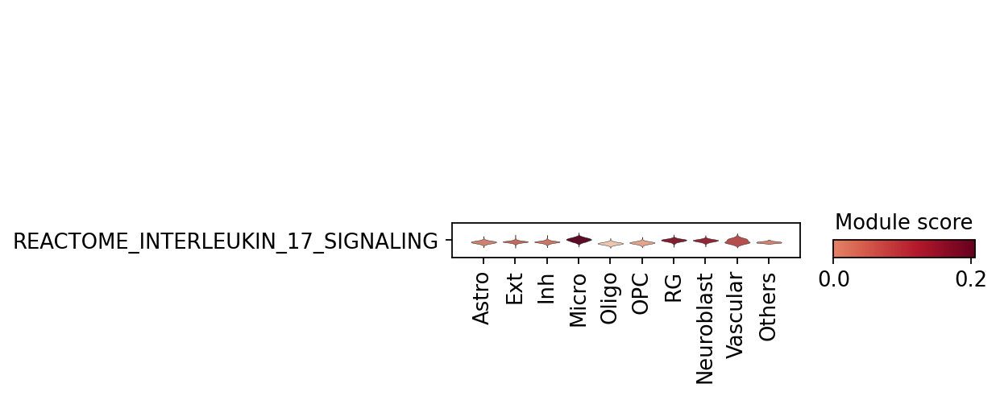

In [8]:
sc.pl.stacked_violin(adata, "REACTOME_INTERLEUKIN_17_SIGNALING", swap_axes=True,
                #  categories_order = desired_order, groupby='Leiden',
                groupby = 'Cell Type',
                #  save = "Stackedplot_Selected_ModuleScore.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0)

In [27]:
sc.set_figure_params(figsize=(6,4), vector_friendly = True)

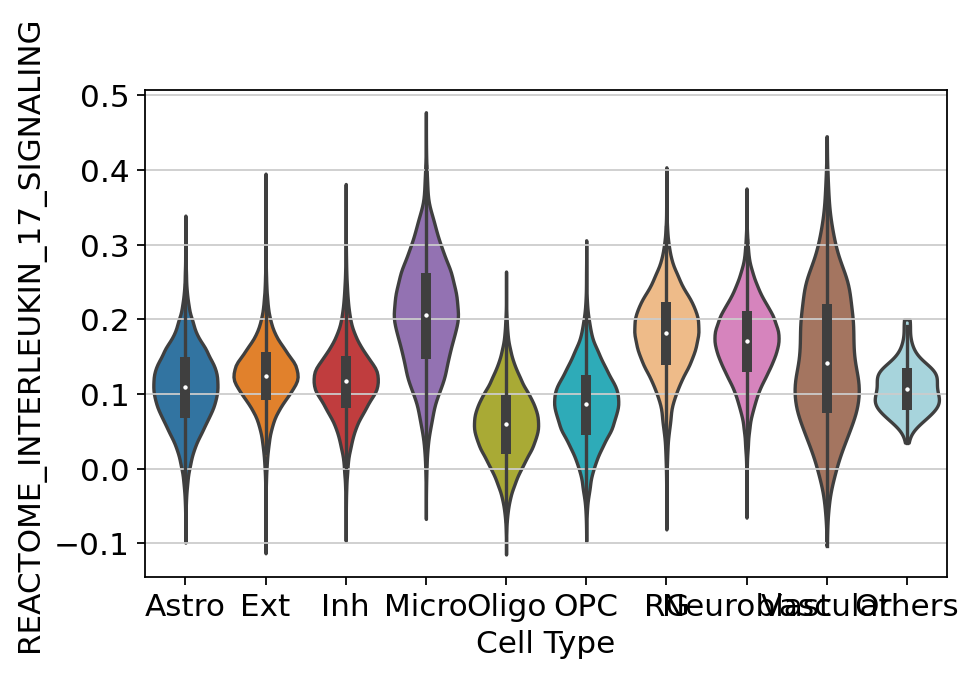

In [28]:
sc.pl.violin(adata, "REACTOME_INTERLEUKIN_17_SIGNALING", swap_axes=True,
                #  categories_order = desired_order, groupby='Leiden',
                groupby = 'Cell Type', 
                  save = "IL17_score.pdf",
                 colorbar_title = "Module score", cmap = "RdBu_r", vcenter = 0,
                 stripplot=False,  # remove the internal dots
        inner="box")

In [12]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [15]:
# Assuming df2 is your DataFrame
df2.rename(columns={'Cell Type': 'Cell_Type'}, inplace=True)

In [16]:
model = ols('REACTOME_INTERLEUKIN_17_SIGNALING ~ Cell_Type', data=df2).fit()

In [18]:
print(sm.stats.anova_lm(model))

                 df      sum_sq    mean_sq             F  PR(>F)
Cell_Type       9.0  503.847444  55.983049  23280.482355     0.0
Residual   393050.0  945.175328   0.002405           NaN     NaN


In [21]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# List to store significant columns
significant_columns = []

# Iterate through columns
for col in df2.columns[2:50]:
    # Fit ANOVA model
    model = ols(f'{col} ~ Cell_Type', data=df2).fit()
    
    # Perform ANOVA
    anova_table = sm.stats.anova_lm(model, typ=2)
    
    # Check if p-value is less than 0.05 (assuming alpha=0.05)
    if anova_table['PR(>F)'][0] > 0.01:
        significant_columns.append(col)

# Print significant columns
print("Columns with significant ANOVA results:")
for col in significant_columns:
    print(col)


Columns with significant ANOVA results:


In [22]:
df2

,Leiden,Cell_Type,REACTOME_INTERLEUKIN_10_SIGNALING,REACTOME_INTERLEUKIN_12_FAMILY_SIGNALING,REACTOME_INTERLEUKIN_12_SIGNALING,REACTOME_INTERLEUKIN_15_SIGNALING,REACTOME_INTERLEUKIN_17_SIGNALING,REACTOME_INTERLEUKIN_1_FAMILY_SIGNALING,REACTOME_INTERLEUKIN_1_SIGNALING,REACTOME_INTERLEUKIN_20_FAMILY_SIGNALING,...,REACTOME_ERYTHROPOIETIN_ACTIVATES_PHOSPHOINOSITIDE_3_KINASE_PI3K,REACTOME_PHOSPHOLIPASE_C_MEDIATED_CASCADE_FGFR1,REACTOME_PHOSPHOLIPASE_C_MEDIATED_CASCADE_FGFR2,REACTOME_PHOSPHOLIPASE_C_MEDIATED_CASCADE_FGFR4,REACTOME_PHOSPHOLIPID_METABOLISM,REACTOME_PHOSPHORYLATION_OF_THE_APC_C,REACTOME_PKA_MEDIATED_PHOSPHORYLATION_OF_CREB,REACTOME_REGULATION_OF_TP53_ACTIVITY_THROUGH_PHOSPHORYLATION,REACTOME_ROLE_OF_PHOSPHOLIPIDS_IN_PHAGOCYTOSIS,REACTOME_SIGNALING_BY_CTNNB1_PHOSPHO_SITE_MUTANTS
10X119_2:TCGTACCCAGACAAAT,C4,RG,-0.013815,0.437812,0.457729,-0.005821,0.225967,0.188751,0.187446,0.001617,...,-0.121899,-0.031429,-0.066424,-0.021338,-0.035791,-0.018591,0.148305,0.061061,-0.050064,0.374649
10X119_2:AGAGCGACACCGCTAG,C4,RG,-0.010086,0.224703,0.242190,-0.019995,0.206362,0.175391,0.231247,-0.021196,...,-0.127011,-0.035405,-0.019417,-0.043181,-0.002257,-0.027705,0.085231,0.115150,-0.033912,-0.080025
10X119_2:AAGGAGCGTTGAGTTC,C3,Neuroblast,-0.033885,0.155538,0.211229,0.007580,0.191755,0.203213,0.221129,-0.050149,...,-0.143943,-0.035081,-0.074839,-0.027055,0.008508,-0.050824,0.063787,0.035059,-0.062434,0.103310
10X119_2:ATAGACCAGGGTGTTG,C4,RG,-0.031340,0.307698,0.342797,-0.000421,0.151277,0.193122,0.194954,-0.062153,...,-0.107427,0.096067,-0.018010,0.011504,0.020624,0.483199,-0.013851,0.208539,-0.046192,0.153810
10X119_2:TTAGGCATCCGAACGC,C4,RG,-0.013663,0.321937,0.375702,-0.010512,0.164683,0.161851,0.160167,-0.014883,...,-0.108105,-0.020723,-0.065094,-0.036857,-0.053755,0.191799,0.057928,0.149179,-0.057234,0.176593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hsDG99HC_TTTGTTGGTTCATCTT-1,C13,Micro,0.072845,0.053103,0.038606,0.175512,0.164393,0.130389,0.096879,0.022750,...,0.636969,-0.048070,-0.093830,-0.039519,0.114099,0.009345,0.081788,-0.015854,0.079888,-0.062006
hsDG99HC_TTTGTTGTCATCTATC-1,C0,Oligo,-0.029521,0.138757,0.142030,0.114187,0.070828,0.091225,0.061963,-0.015423,...,0.070407,0.017123,0.040158,0.017103,0.139647,-0.214377,0.174284,-0.037169,-0.028643,0.191684
hsDG99HC_TTTGTTGTCCTCGATC-1,C1,Ext,-0.023045,-0.021384,-0.016980,0.000811,0.173531,0.033652,0.024136,0.053190,...,0.001466,-0.027621,-0.084025,-0.026563,0.091533,0.020106,0.219834,-0.026561,-0.020495,0.121317
hsDG99HC_TTTGTTGTCGTTAGAC-1,C0,Oligo,0.003706,0.061797,0.048615,0.295633,0.058780,0.113865,0.037413,0.010026,...,0.152270,0.061552,0.070351,0.076528,0.102346,-0.112758,0.114093,0.020509,0.008912,0.184005


In [23]:
df2.to_csv("df2.csv")